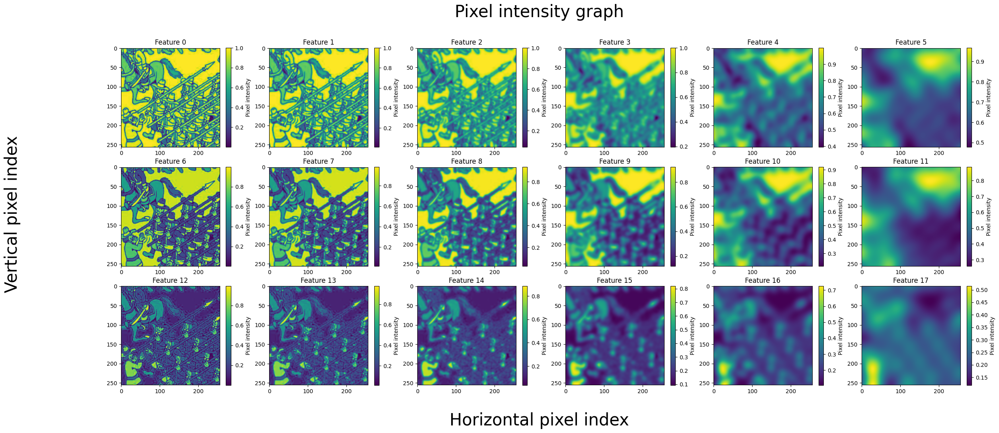

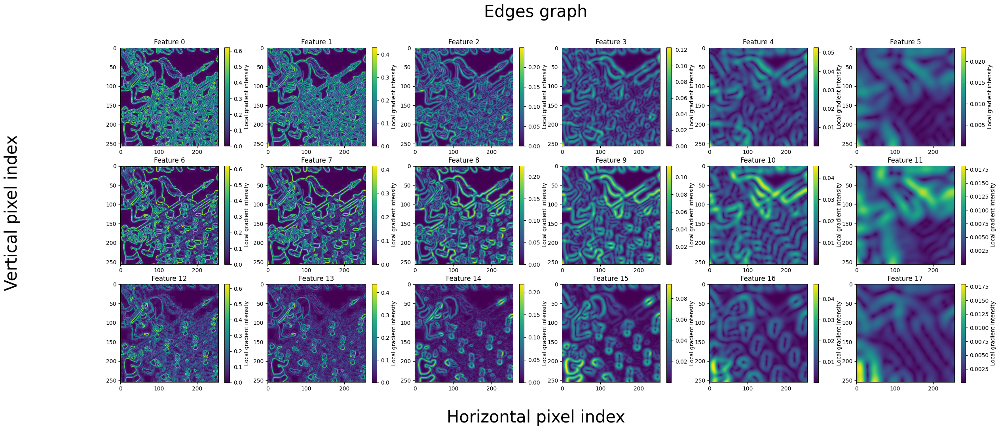

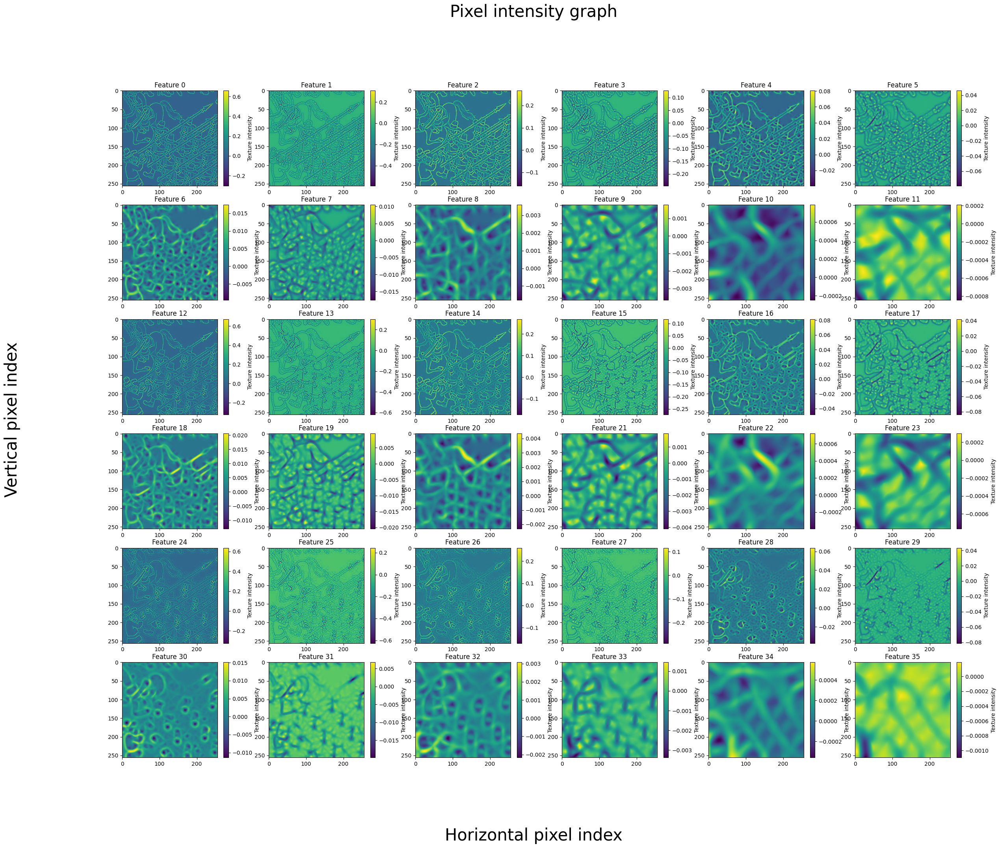

In [151]:
import numpy as np

import skimage as ski

import os

import matplotlib.pyplot as plt
from matplotlib.pyplot import subplots as splt

# Extract different resolution and color categories from image dataset. Total is 9 + the original images.
waldo_images = r"256\waldo\*.jpg"
not_waldo_images = r"256\notwaldo\*.jpg"

waldo_dataset = ski.io.imread_collection(waldo_images)
not_waldo_dataset = ski.io.imread_collection(not_waldo_images)

img = not_waldo_dataset[0]
img2 = not_waldo_dataset[1]

# Features' array shape is a tuple of (256, 256, n), where n is the number of features extracted.
# Organized features extracted
pixel_intensity = ski.feature.multiscale_basic_features(img, channel_axis = 2, edges = False, texture = False)
edges = ski.feature.multiscale_basic_features(img, channel_axis = 2, intensity = False, texture = False)
texture = ski.feature.multiscale_basic_features(img, channel_axis = 2, edges = False, intensity = False)

nrows, ncols = 3, 6

fig, ax = splt(nrows, ncols, figsize = (28, 11))
fig.suptitle("Pixel intensity graph", fontsize = 30)
fig.supxlabel("Horizontal pixel index", fontsize = 30)
fig.supylabel("Vertical pixel index", fontsize = 30)
# Display pixel intensity graph
for i in range(pixel_intensity.shape[2]):
    row = i // 6
    col = i % 6
    cax = ax[row, col].imshow(pixel_intensity[:, :, i])
    ax[row, col].set_title(f"Feature {i}")
    cbar = plt.colorbar(cax, ax = ax[row, col], label = "Pixel intensity")

plt.show()

fig, ax = splt(nrows, ncols, figsize = (28, 11))
fig.suptitle("Edges graph", fontsize = 30)
fig.supxlabel("Horizontal pixel index", fontsize = 30)
fig.supylabel("Vertical pixel index", fontsize = 30)
# Display edge graph
for i in range(edges.shape[2]):
    row = i // 6
    col = i % 6
    cax = ax[row, col].imshow(edges[:, :, i])
    ax[row, col].set_title(f"Feature {i}")
    cbar = plt.colorbar(cax, ax = ax[row, col], label = "Local gradient intensity")

plt.show()

nrows, ncols = 6, 6
fig, ax = splt(nrows, ncols, figsize = (28, 22))
fig.suptitle("Pixel intensity graph", fontsize = 30)
fig.supxlabel("Horizontal pixel index", fontsize = 30)
fig.supylabel("Vertical pixel index", fontsize = 30)
# Display texture graph
for i in range(texture.shape[2]):
    row = i // 6
    col = i % 6
    cax = ax[row, col].imshow(texture[:, :, i])
    ax[row, col].set_title(f"Feature {i}")
    cbar = plt.colorbar(cax, ax = ax[row, col], label = "Texture intensity")

plt.show()

